In [31]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import train_test_split
from sklearn.neighbors import KNeighborsClassifier
from sklearn.metrics import accuracy_score
from sklearn.preprocessing import StandardScaler


In [32]:
df = pd.read_csv('train.csv')
df

,label,pixel0,pixel1,pixel2,pixel3,pixel4,pixel5,pixel6,pixel7,pixel8,...,pixel774,pixel775,pixel776,pixel777,pixel778,pixel779,pixel780,pixel781,pixel782,pixel783
0,1,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2,1,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,4,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
41995,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
41996,1,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
41997,7,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
41998,6,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [33]:
X = df.iloc[:,1:]
y = df.iloc[:,0]

In [34]:
X_train, X_test ,y_train, y_test = train_test_split(X,y,test_size=0.2,random_state=42)

In [35]:
X_train.shape

(33600, 784)

# Without PCA

In [36]:
# ss = StandardScaler()
# X_train = ss.fit_transform(X_train)
# X_test = ss.transform(X_test)

In [37]:
knn = KNeighborsClassifier()

knn.fit(X_train,y_train)

KNeighborsClassifier()

In [38]:
import time
start = time.time()
y_pred = knn.predict(X_test)
time.time() - start

7.557579755783081

In [39]:
accuracy_score(y_test,y_pred)

0.9648809523809524

# Using PCA

In [65]:
df = pd.read_csv('train.csv')
X = df.iloc[:, 1:]
y = df.iloc[:, 0]
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

In [41]:
from sklearn.decomposition import PCA
pca = PCA(n_components=200)

In [42]:
X_train = pca.fit_transform(X_train)
X_test = pca.transform(X_test)

In [44]:
knn = KNeighborsClassifier()
knn.fit(X_train,y_train)

KNeighborsClassifier()

In [45]:
start = time.time()
y_pred = knn.predict(X_test)
time.time() - start

1.2631428241729736

In [46]:
accuracy_score(y_test,y_pred)

0.9675

In [62]:
def bestPCA(limit):
    startTime = time.time()
    maxI = 1
    maxAcc = -1
    for i in range(1,limit):
        pca = PCA(n_components=i)
        
        X_train_trf = pca.fit_transform(X_train)
        X_test_trf = pca.transform(X_test)
        
        knc = KNeighborsClassifier()
        
        knc.fit(X_train_trf,y_train)
        
        y_pred_trf = knc.predict(X_test_trf)
        
        accu = accuracy_score(y_test,y_pred_trf)
        # print(i, accu)
        
        if accu > maxAcc :
            maxAcc = accu
            maxI = i
    avgTime  = (time.time() - startTime)/limit    
    return maxAcc, maxI, avgTime
        

In [63]:
bestPCA(20)

(0.9644047619047619, 19, 1.4416558742523193)

# transforming to a 2D coordinate system

In [66]:
pca = PCA(n_components=2)
X_train_trf = pca.fit_transform(X_train)
X_test_trf = pca.transform(X_test)
X_train_trf

array([[-226.6063447 ,  305.88547126],
       [  38.33569976, -461.0799304 ],
       [-305.49096087, -351.66341353],
       ...,
       [ -27.99968208,  596.08623419],
       [ 233.96789236,   18.62761091],
       [1096.50208105, -254.74076671]])

In [67]:
import plotly.express as px

y_train_trf = y_train.astype(str)
fig = px.scatter(x=X_train_trf[:, 0],
                 y=X_train_trf[:, 1],
                 color=y_train_trf,
                 color_discrete_sequence=px.colors.qualitative.G10
                 )
fig.show()

# transforming in 3D

In [68]:
pca = PCA(n_components=3)
X_train_trf = pca.fit_transform(X_train)
X_test_trf = pca.transform(X_test)
X_train_trf

array([[-226.60434712,  305.86453482,  417.25220639],
       [  38.33490035, -461.04638034,  100.32003132],
       [-305.493047  , -351.63588826, -961.43053733],
       ...,
       [ -28.00712501,  596.111332  ,  606.10034253],
       [ 233.97247003,   18.58080342, -148.10729695],
       [1096.50496318, -254.74442033, -560.26825932]])

In [71]:
import plotly.express as px

y_train_trf = y_train.astype(str)
fig = px.scatter_3d(df, x=X_train_trf[:, 0], y=X_train_trf[:, 1], z=X_train_trf[:, 2],
                    color=y_train_trf)
fig.update_layout(
    margin=dict(l=20, r=20, t=20, b=20),
    paper_bgcolor="LightSteelBlue",
)
fig.show()

In [70]:
# Eigen Values (top 3)
pca.explained_variance_

array([335506.57620161, 244807.10460279, 212051.03113407])

In [72]:
pca.components_

array([[-9.85666421e-17,  2.97624140e-18, -8.92397292e-20, ...,
         0.00000000e+00,  0.00000000e+00,  0.00000000e+00],
       [ 2.46152094e-16, -1.40268993e-17,  1.87627678e-17, ...,
        -0.00000000e+00, -0.00000000e+00, -0.00000000e+00],
       [-3.78127846e-17, -8.33432114e-17, -2.79919568e-18, ...,
         0.00000000e+00,  0.00000000e+00,  0.00000000e+00]])

In [73]:
# Eigen Vector (top 3 for best eigen value)
pca.components_.shape

(3, 784)

In [74]:
pca.explained_variance_ratio_

array([0.09770722, 0.07129345, 0.06175413])

In [75]:
pca = PCA(n_components=None)
X_train_trf = pca.fit_transform(X_train)
X_test_trf = pca.transform(X_test)

In [76]:
pca.explained_variance_.shape

(784,)

In [77]:
pca.components_.shape

(784, 784)

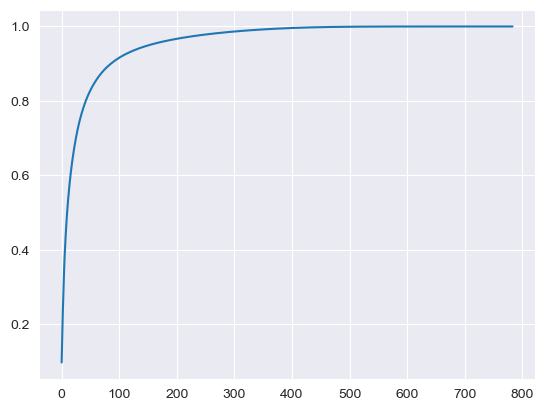

In [78]:
np.cumsum(pca.explained_variance_ratio_)
plt.plot(np.cumsum(pca.explained_variance_ratio_))